# subscribers classification

In [1]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline

In [338]:
%%time
df=pd.read_csv('data\Bank Marketing.csv')
pd.set_option('display.max_columns',None)
df

Wall time: 80.8 ms


,Age,Job,Marital Status,Education,Credit,Balance (euros),Housing Loan,Personal Loan,Contact,Last Contact Day,Last Contact Month,Last Contact Duration,Campaign,Pdays,Previous,Poutcome,Subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,1
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,1
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,1
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,1
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,2
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,2
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,2
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,1


In [339]:
df.columns=df.columns.str.lower()

In [340]:
df.rename(columns={'balance (euros)':'balance','marital status':'marital_status','personal loan':'personal_loan','housing loan':'housing_loan',
'last contact day':'lc_day','last contact month':'lc_month','last contact duration':'lc_duration'},inplace=True)

In [341]:
df.columns

Index(['age', 'job', 'marital_status', 'education', 'credit', 'balance',
       'housing_loan', 'personal_loan', 'contact', 'lc_day', 'lc_month',
       'lc_duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'subscription'],
      dtype='object')

In [342]:
df.subscription=df.subscription.map({1:0,2:1})

In [343]:
df.subscription.value_counts()

0    39922
1     5289
Name: subscription, dtype: int64

In [344]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [345]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45211 non-null  int64 
 1   job             45211 non-null  object
 2   marital_status  45211 non-null  object
 3   education       45211 non-null  object
 4   credit          45211 non-null  object
 5   balance         45211 non-null  int64 
 6   housing_loan    45211 non-null  object
 7   personal_loan   45211 non-null  object
 8   contact         45211 non-null  object
 9   lc_day          45211 non-null  int64 
 10  lc_month        45211 non-null  object
 11  lc_duration     45211 non-null  int64 
 12  campaign        45211 non-null  int64 
 13  pdays           45211 non-null  int64 
 14  previous        45211 non-null  int64 
 15  poutcome        45211 non-null  object
 16  subscription    45211 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 5.9+ MB


In [346]:
%%time
df.isna().sum()

Wall time: 12.9 ms


age               0
job               0
marital_status    0
education         0
credit            0
balance           0
housing_loan      0
personal_loan     0
contact           0
lc_day            0
lc_month          0
lc_duration       0
campaign          0
pdays             0
previous          0
poutcome          0
subscription      0
dtype: int64

In [347]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [348]:
num_features=[i for i in df.columns if df[i].dtype!='O']
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

In [349]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [350]:
cat_features=[i for i in df.columns if i not in num_features]
cat_features

['job',
 'marital_status',
 'education',
 'credit',
 'housing_loan',
 'personal_loan',
 'contact',
 'lc_month',
 'poutcome']

## Exploratory data analysis

In [15]:
df.poutcome.value_counts(normalize=True)

unknown    0.817478
failure    0.108403
other      0.040698
success    0.033421
Name: poutcome, dtype: float64

In [16]:
for i in cat_features:
    print(i,':---->\n',df[i].value_counts(normalize=True)*100)

job :---->
 blue-collar      21.525735
management       20.919688
technician       16.803433
admin.           11.437482
services          9.188029
retired           5.007631
self-employed     3.492513
entrepreneur      3.289023
unemployed        2.882042
housemaid         2.742695
student           2.074716
unknown           0.637013
Name: job, dtype: float64
marital_status :---->
 married     60.193316
single      28.289576
divorced    11.517109
Name: marital_status, dtype: float64
education :---->
 secondary    51.319369
tertiary     29.419831
primary      15.153392
unknown       4.107407
Name: education, dtype: float64
credit :---->
 no     98.197341
yes     1.802659
Name: credit, dtype: float64
housing_loan :---->
 yes    55.583818
no     44.416182
Name: housing_loan, dtype: float64
personal_loan :---->
 no     83.977351
yes    16.022649
Name: personal_loan, dtype: float64
contact :---->
 cellular     64.774059
unknown      28.798301
telephone     6.427639
Name: contact, dtype: flo

In [17]:
a=df.subscription.value_counts()

In [18]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [19]:
plt.rcdefaults

<function matplotlib.pyplot.rcdefaults()>

In [20]:
plt.rcParams['figure.figsize']= [10, 8]
plt.style.use('fivethirtyeight')

In [21]:
a

0    39922
1     5289
Name: subscription, dtype: int64

([<matplotlib.patches.Wedge at 0x267d16b1940>,
 [Text(-1.0265439893343442, 0.3952308666609052, 'not-subscribed'),
  Text(1.0265440170874796, -0.39523079457691607, 'subscribed')])

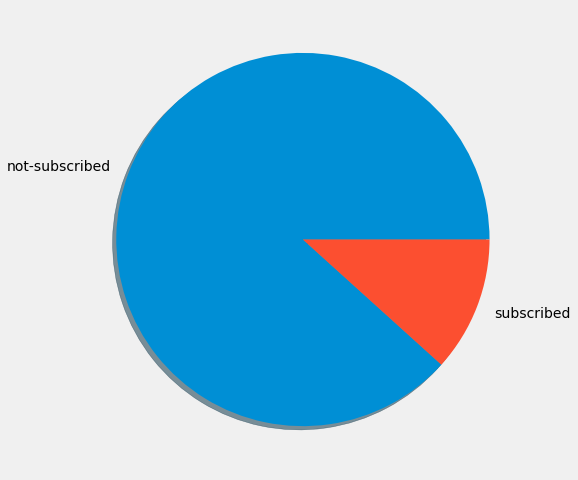

In [22]:
#plt.figure(figsize=(10, 10))
label=['not-subscribed','subscribed']
plt.pie(a,labels=label,shadow=True)

<AxesSubplot:xlabel='education', ylabel='count'>

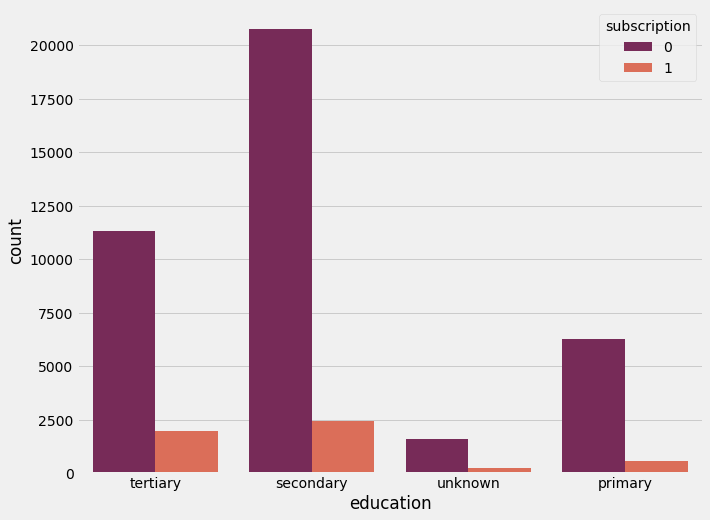

In [23]:
sns.countplot(data=df,x='education',hue='subscription',palette='rocket')

In [24]:
dir(sns.palettes)

['MPL_QUAL_PALS',
 'QUAL_PALETTES',
 'QUAL_PALETTE_SIZES',
 'SEABORN_PALETTES',
 '_ColorPalette',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_color_to_rgb',
 '_parse_cubehelix_args',
 'blend_palette',
 'color_palette',
 'colorsys',
 'crayon_palette',
 'crayons',
 'cubehelix_palette',
 'cycle',
 'dark_palette',
 'desaturate',
 'diverging_palette',
 'get_color_cycle',
 'hls_palette',
 'husl',
 'husl_palette',
 'light_palette',
 'mpl',
 'mpl_palette',
 'np',
 'set_color_codes',
 'xkcd_palette',
 'xkcd_rgb']

<AxesSubplot:xlabel='age', ylabel='Count'>

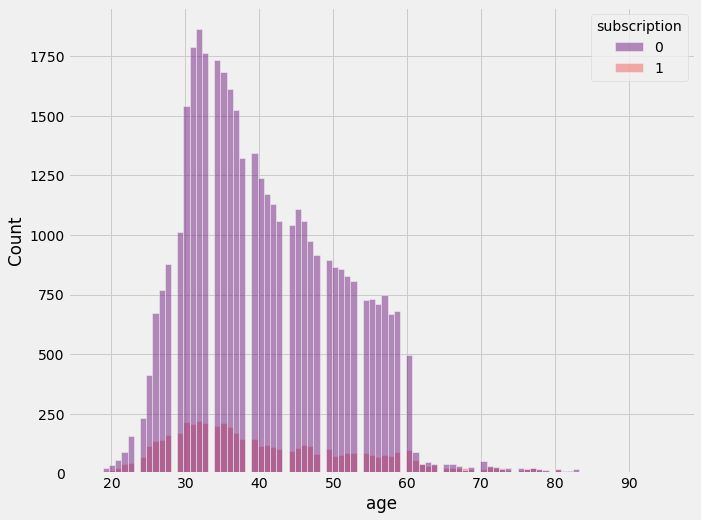

In [25]:
sns.color_palette(palette='Set1')
sns.histplot(data=df,x='age',hue='subscription',alpha=0.5,palette='magma')

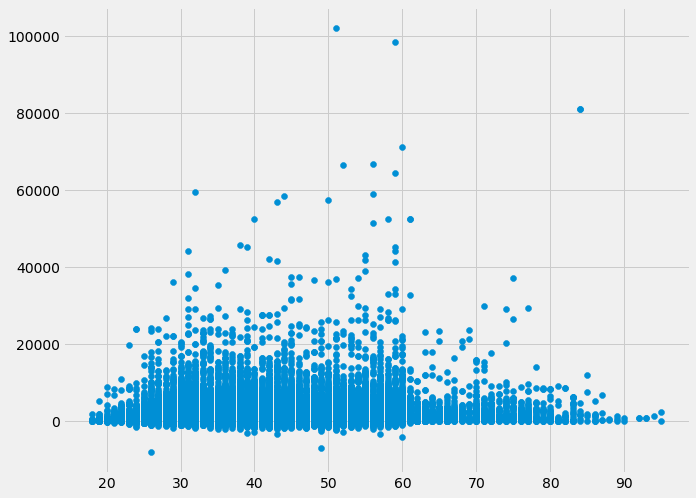

In [26]:
plt.scatter(df.age,df['balance'])

In [27]:
df.columns

Index(['age', 'job', 'marital_status', 'education', 'credit', 'balance',
       'housing_loan', 'personal_loan', 'contact', 'lc_day', 'lc_month',
       'lc_duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'subscription'],
      dtype='object')

<AxesSubplot:xlabel='age', ylabel='balance'>

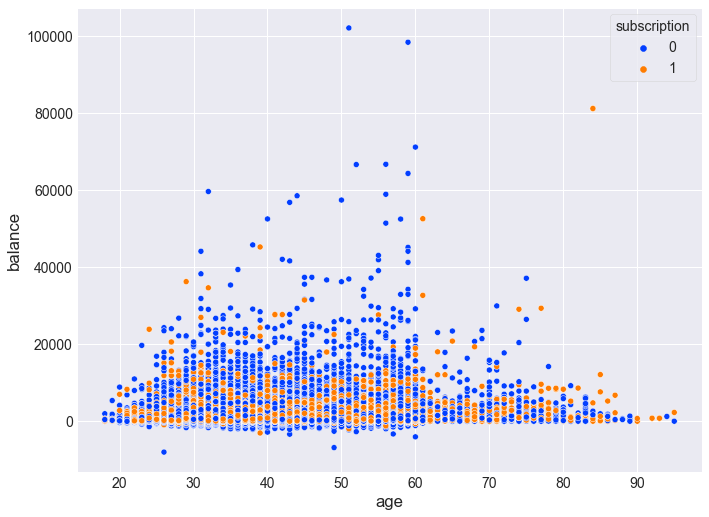

In [28]:
sns.set_style('darkgrid')
sns.set_palette('Set1')
sns.scatterplot(data=df,y='balance',x='age',hue='subscription',palette='bright')

In [29]:
import plotly.express as px
px.scatter_3d(data_frame=df,x='age',y='balance',z='previous',color='subscription')

<AxesSubplot:xlabel='balance'>

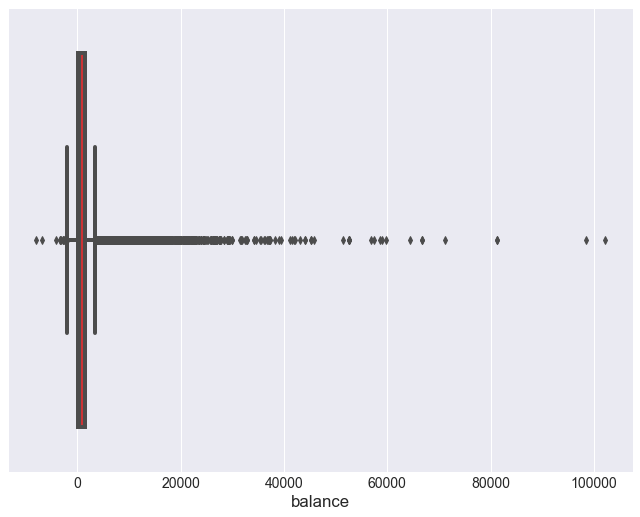

In [30]:
sns.color_palette('bright')
sns.boxplot(data=df,x='balance')

In [31]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

In [32]:
cat_features

['job',
 'marital_status',
 'education',
 'credit',
 'housing_loan',
 'personal_loan',
 'contact',
 'lc_month',
 'poutcome']

<AxesSubplot:xlabel='age', ylabel='education'>

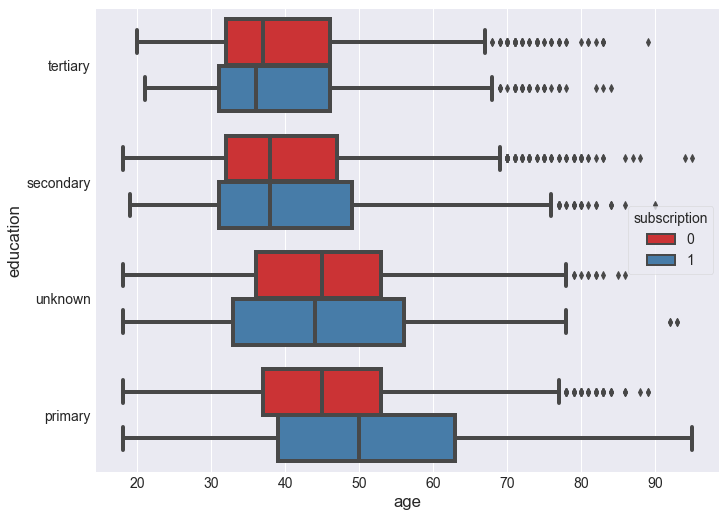

In [33]:
sns.boxplot(data=df,x='age',y='education',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='balance'>

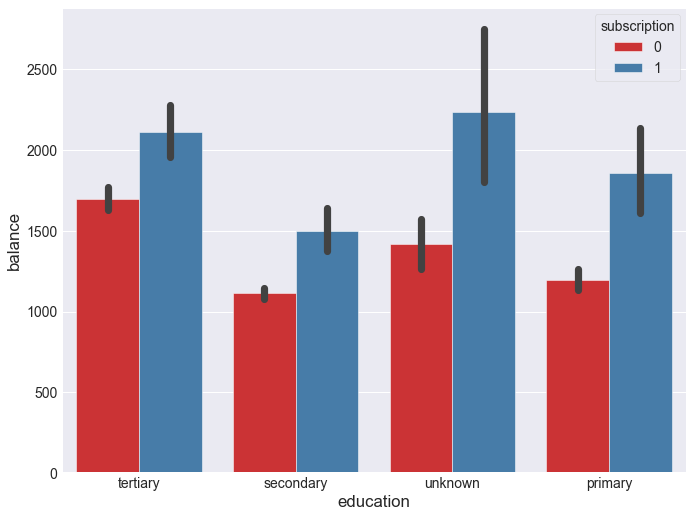

In [34]:
sns.barplot(data=df,y='balance',x='education',hue='subscription')

<AxesSubplot:xlabel='marital_status', ylabel='balance'>

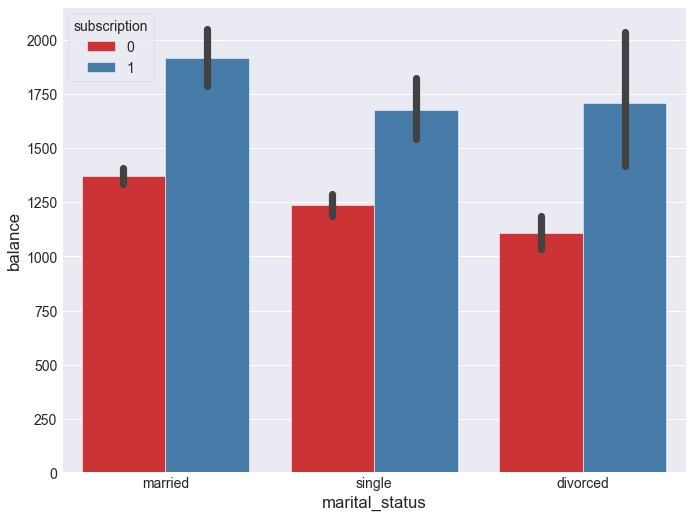

In [35]:
sns.barplot(data=df,y='balance',x='marital_status',hue='subscription')

<AxesSubplot:xlabel='marital_status', ylabel='lc_duration'>

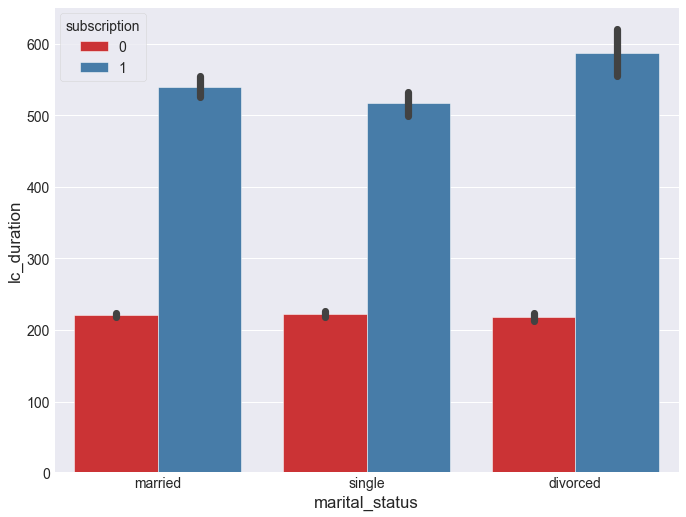

In [36]:
sns.barplot(data=df,y='lc_duration',x='marital_status',hue='subscription')

<AxesSubplot:xlabel='housing_loan', ylabel='lc_duration'>

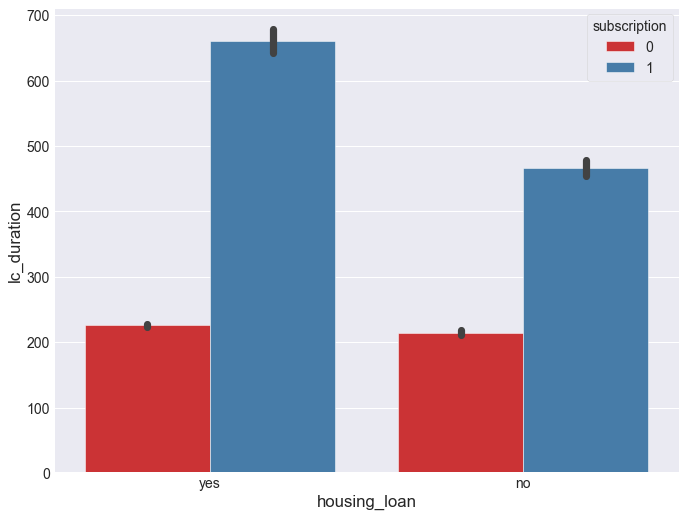

In [37]:
sns.barplot(data=df,y='lc_duration',x='housing_loan',hue='subscription')

<AxesSubplot:xlabel='credit', ylabel='lc_duration'>

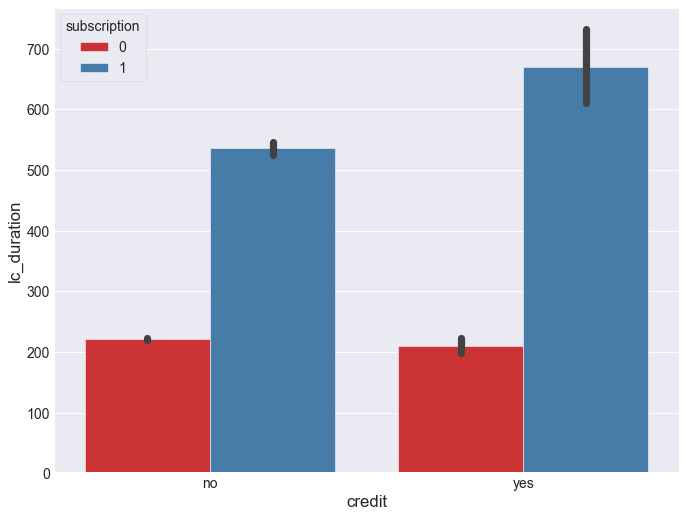

In [38]:
sns.barplot(data=df,y='lc_duration',x='credit',hue='subscription')

<AxesSubplot:xlabel='job', ylabel='lc_duration'>

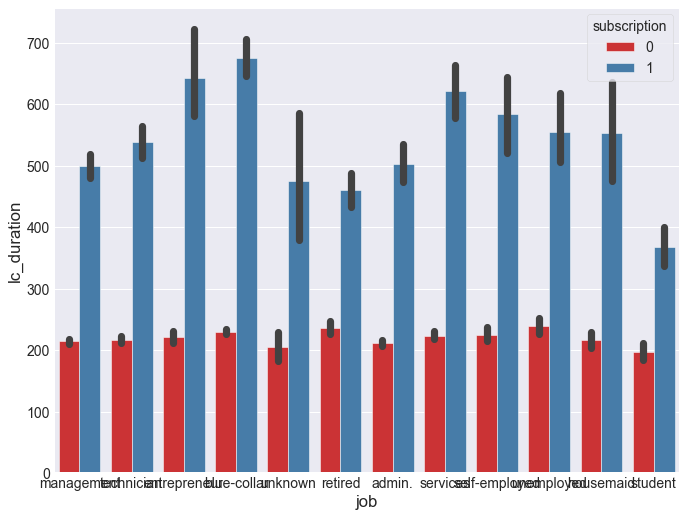

In [39]:
sns.barplot(data=df,y='lc_duration',x='job',hue='subscription')

<AxesSubplot:xlabel='poutcome', ylabel='lc_duration'>

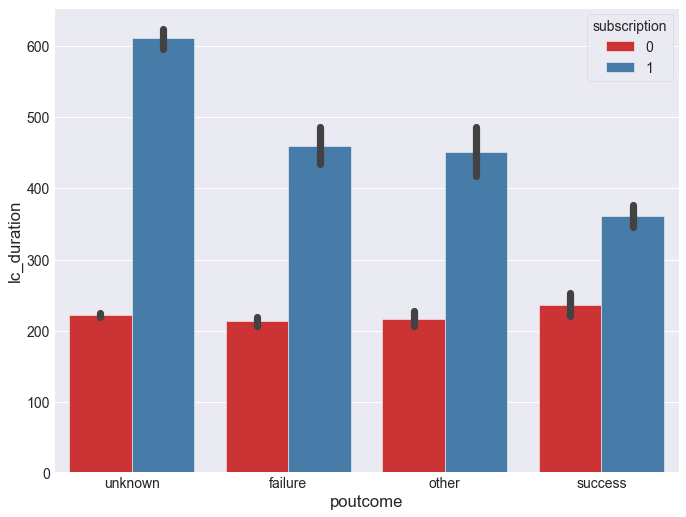

In [40]:
sns.barplot(data=df,y='lc_duration',x='poutcome',hue='subscription')

<AxesSubplot:xlabel='personal_loan', ylabel='lc_duration'>

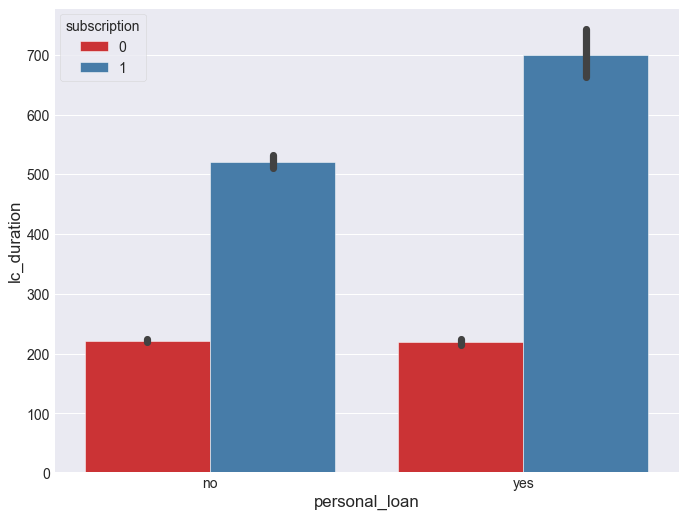

In [41]:
sns.barplot(data=df,y='lc_duration',x='personal_loan',hue='subscription')

<AxesSubplot:xlabel='lc_month', ylabel='lc_duration'>

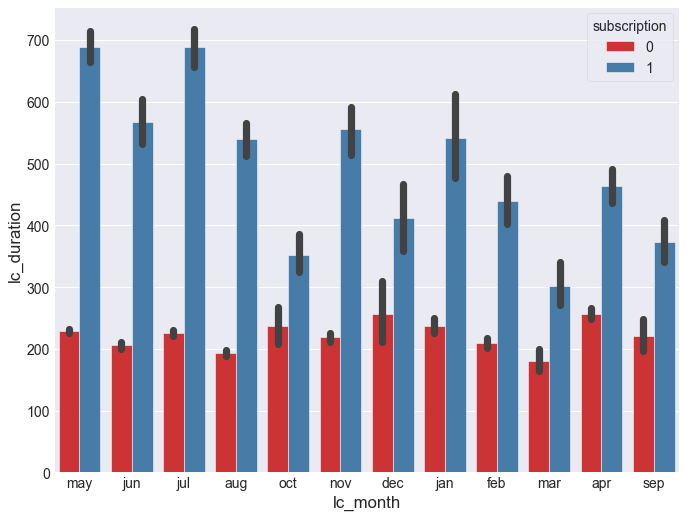

In [42]:
sns.barplot(data=df,y='lc_duration',x='lc_month',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='lc_duration'>

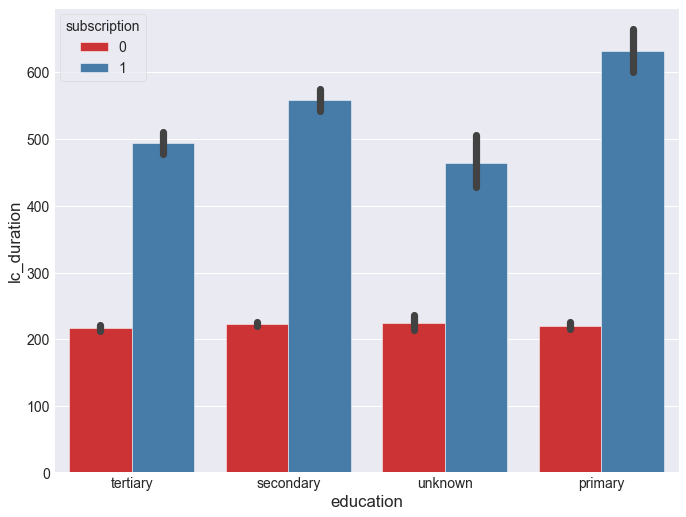

In [43]:
sns.barplot(data=df,y='lc_duration',x='education',hue='subscription')

<AxesSubplot:xlabel='marital_status', ylabel='previous'>

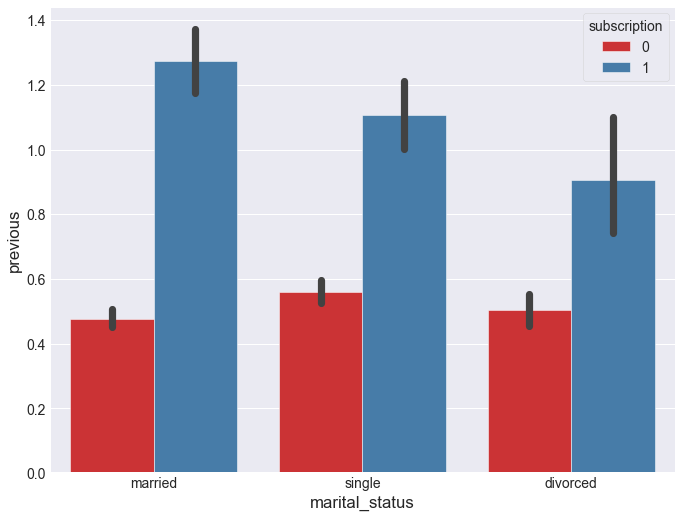

In [44]:
sns.barplot(data=df,y='previous',x='marital_status',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='previous'>

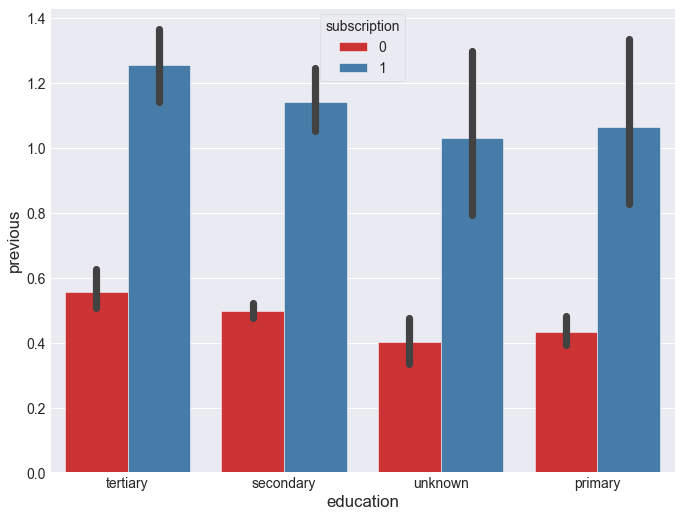

In [45]:
sns.barplot(data=df,y='previous',x='education',hue='subscription')

<AxesSubplot:xlabel='marital_status', ylabel='pdays'>

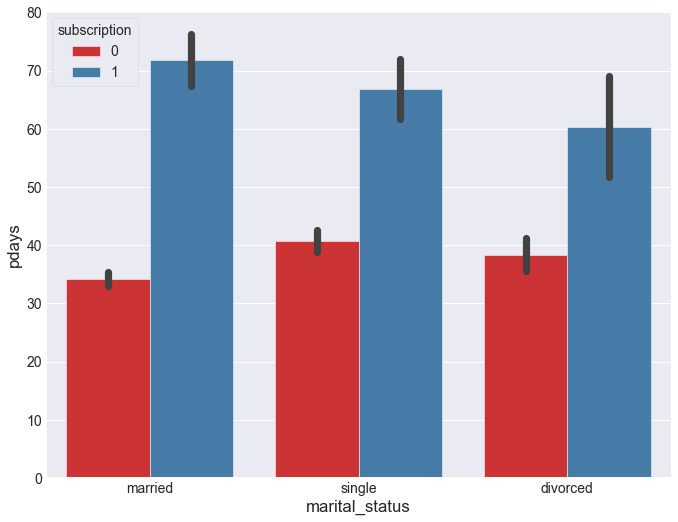

In [46]:
sns.barplot(data=df,y='pdays',x='marital_status',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='lc_day'>

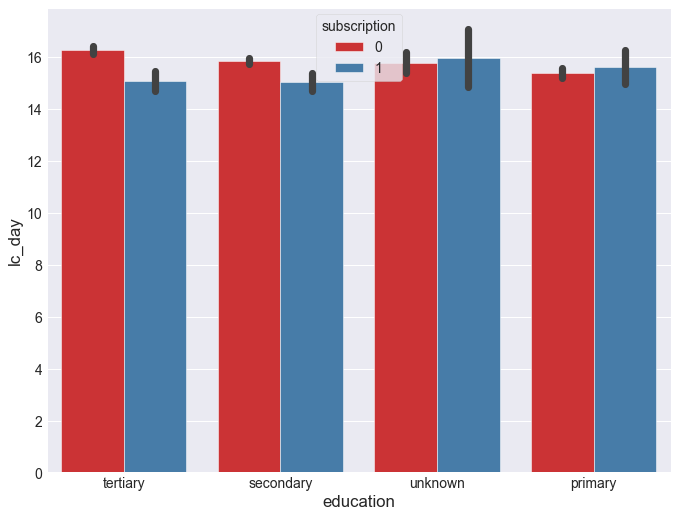

In [47]:
sns.barplot(data=df,y='lc_day',x='education',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='campaign'>

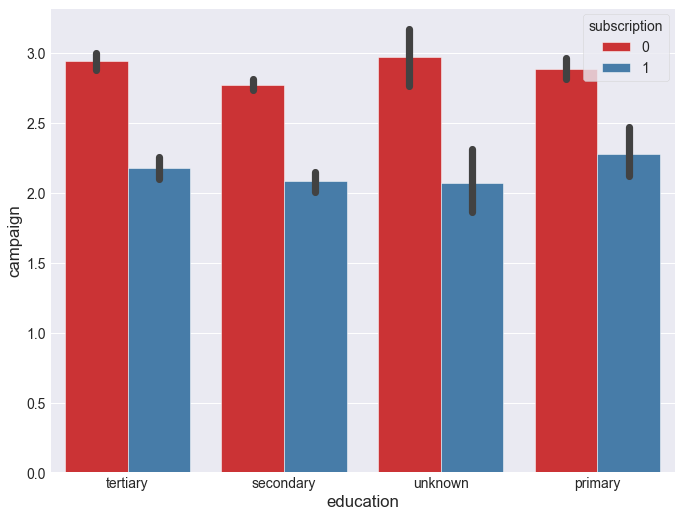

In [48]:
sns.barplot(data=df,y='campaign',x='education',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='lc_duration'>

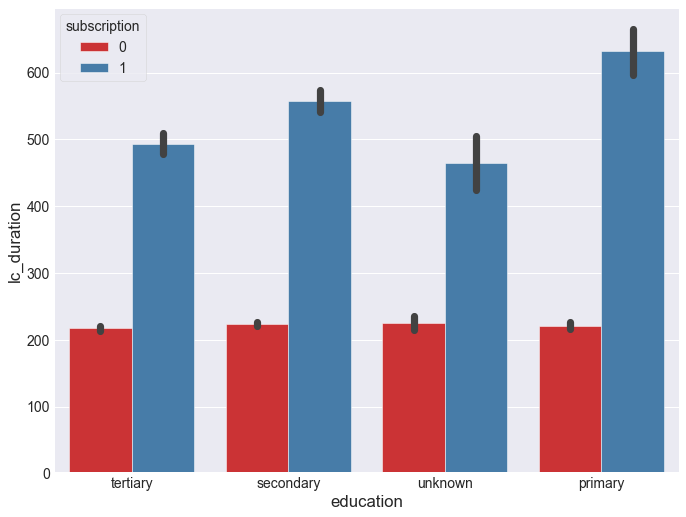

In [49]:
sns.barplot(data=df,y='lc_duration',x='education',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='age'>

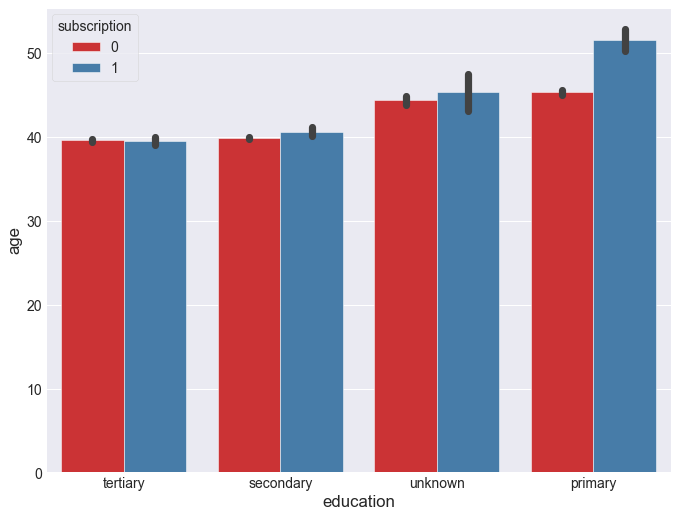

In [50]:
sns.barplot(data=df,y='age',x='education',hue='subscription')

<AxesSubplot:xlabel='contact', ylabel='lc_duration'>

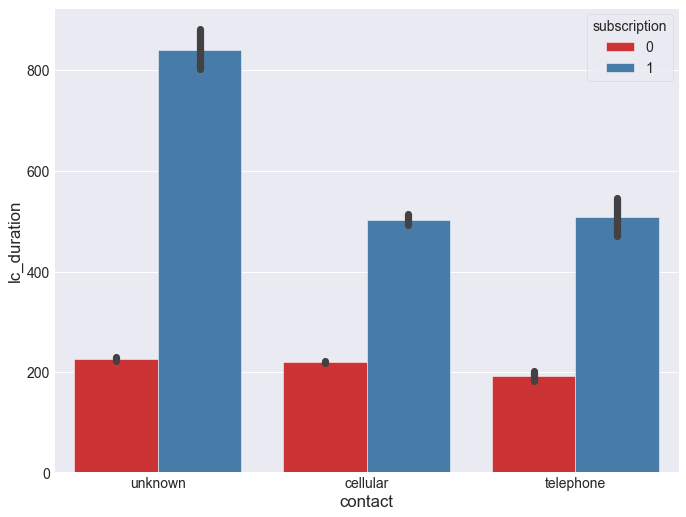

In [51]:
sns.barplot(data=df,y='lc_duration',x='contact',hue='subscription')

In [52]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

## insights:

1.   here we can observe that those who took subscription have high bank balance compared to non-subscribers
2.   who talked for more than 220 seconds on last call are very highly likely to subscribe
3.   those who are contacted after 50 days are very high likely to be subscribers
4.   i think contact is a useless feature

In [53]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [54]:
df.corrwith(df["subscription"])


age             0.025155
balance         0.052838
lc_day         -0.028348
lc_duration     0.394521
campaign       -0.073172
pdays           0.103621
previous        0.093236
subscription    1.000000
dtype: float64

In [55]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

<AxesSubplot:xlabel='age'>

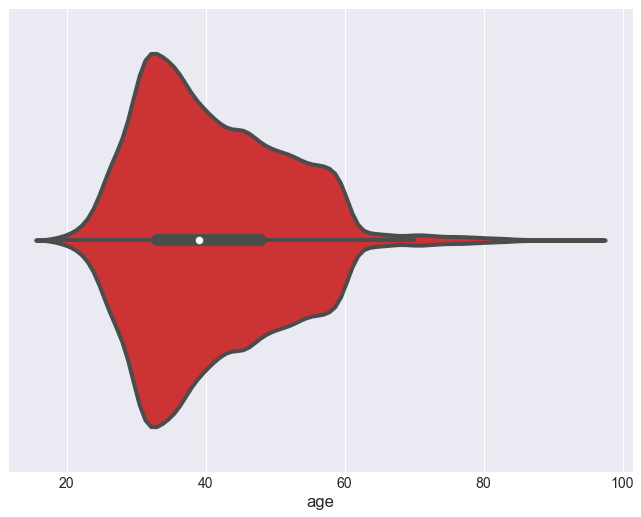

In [57]:
sns.violinplot(data=df,x='age')

<AxesSubplot:xlabel='campaign'>

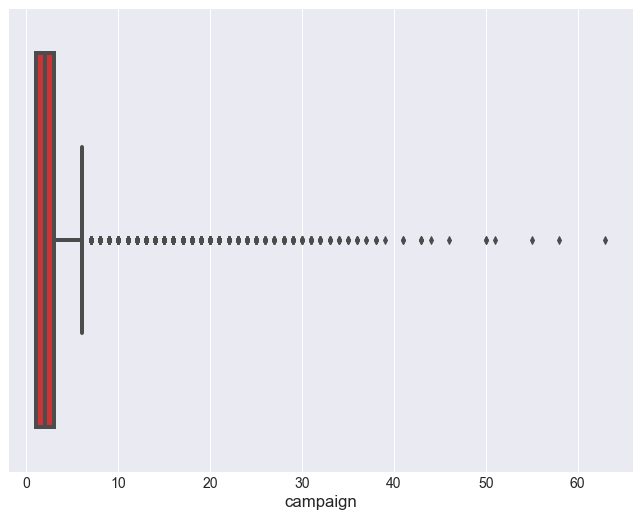

In [58]:
sns.boxplot(data=df,x='campaign')

<AxesSubplot:xlabel='lc_duration'>

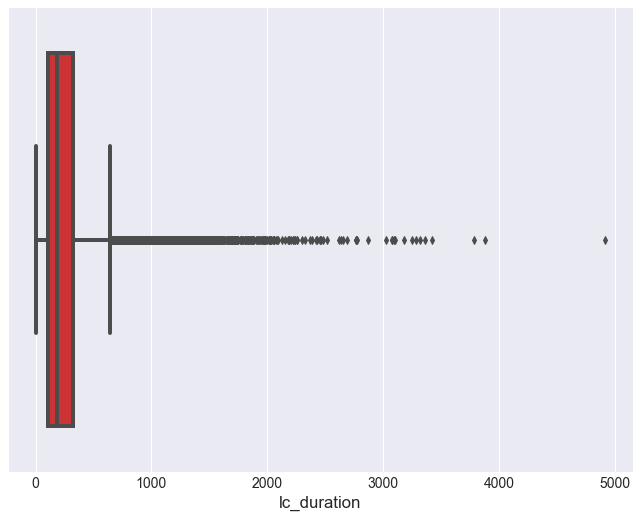

In [59]:
sns.boxplot(data=df,x='lc_duration')

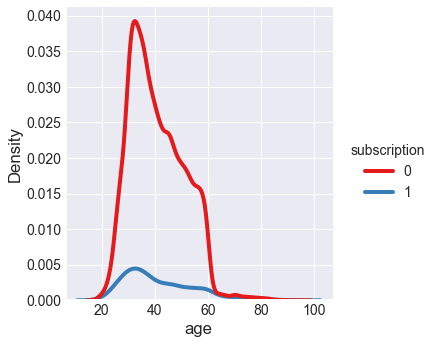

In [60]:
sns.displot(data=df,x='age',hue='subscription',kind='kde')

<AxesSubplot:xlabel='credit', ylabel='count'>

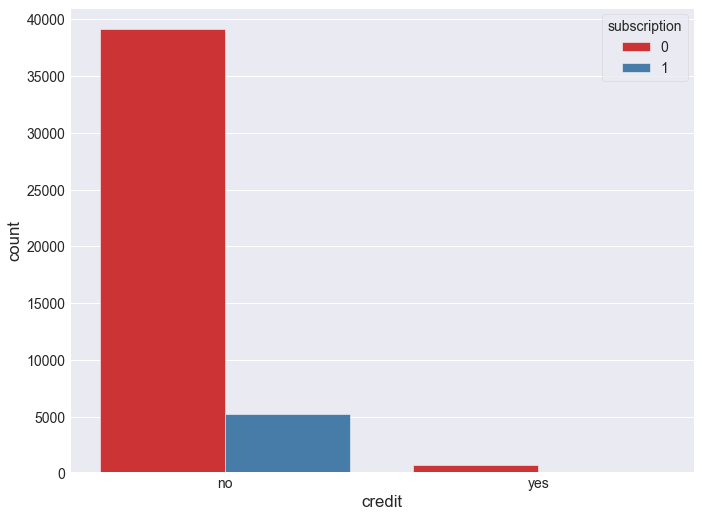

In [61]:
sns.countplot(data=df,x='credit',hue='subscription')

<AxesSubplot:>

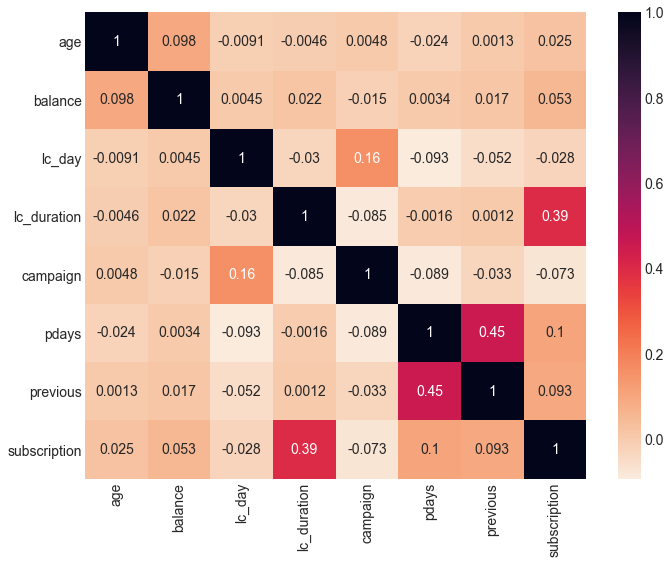

In [62]:
sns.heatmap(df.corr(),annot=True,cmap='rocket_r')

In [63]:
df.pdays.nunique()

559

In [64]:
df.previous.nunique()

41

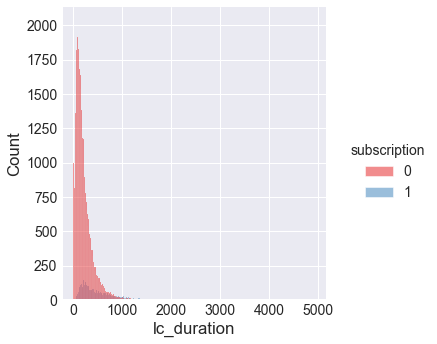

In [65]:
plt.rcdefaults
sns.displot(data=df,x='lc_duration',hue='subscription',palette='Set1')

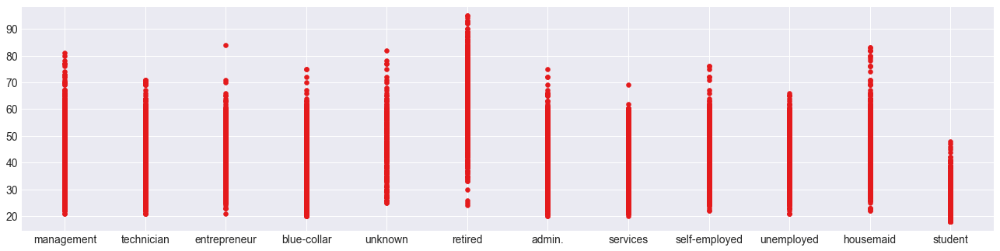

In [66]:
plt.figure(figsize=(20,5))
plt.xkcd
plt.scatter(df.job,df.age)

In [67]:
px.scatter_3d(data_frame=df,x='age',y='job',z='education',color='subscription')

Text(0.5, 0.98, 'figure title')

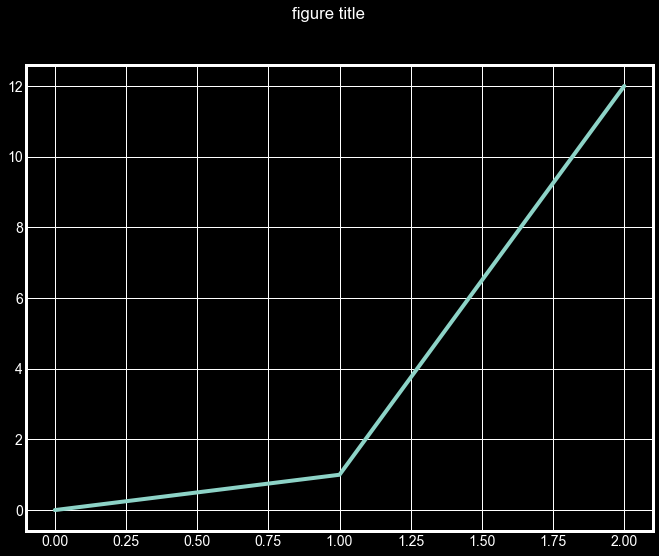

In [68]:
plt.style.use(['dark_background'])
plt.plot([0,1,12])
plt.suptitle('figure title', color='w')

<AxesSubplot:xlabel='education', ylabel='age'>

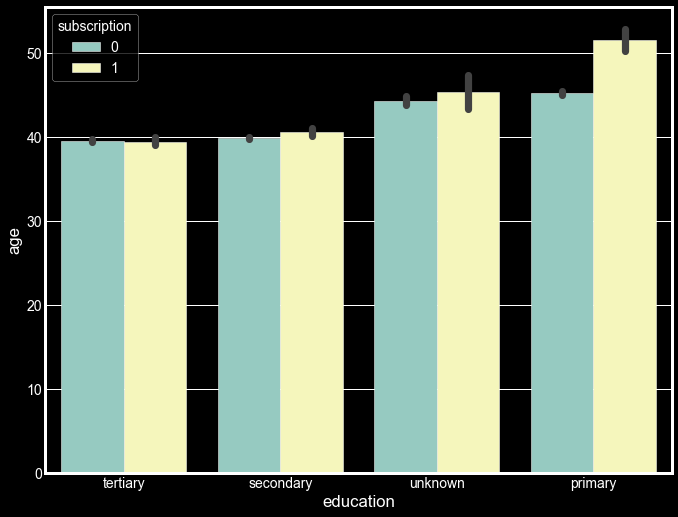

In [69]:
sns.barplot(data=df,x='education',y='age',hue='subscription')

<AxesSubplot:xlabel='education', ylabel='age'>

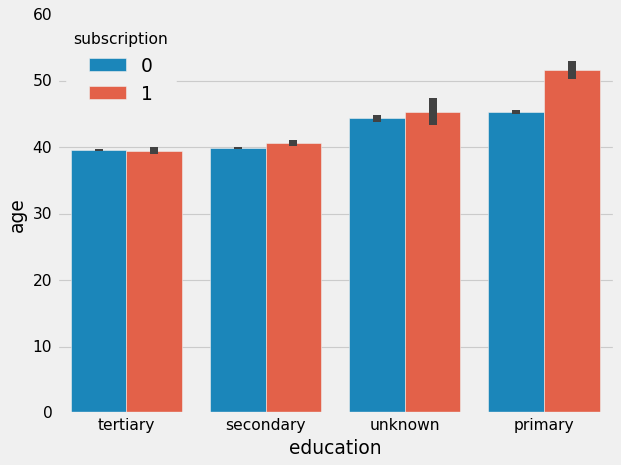

In [107]:
plt.style.use('fivethirtyeight')
sns.barplot(data=df,x='education',y='age',hue='subscription')

In [71]:
subscribers=df.groupby('subscription').get_group(1)
subscribers

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
83,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,1
86,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,1
87,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,1
129,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,1
168,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,1
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,1
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1


In [72]:
non_subscribers=df.groupby('subscription').get_group(0)

In [73]:
non_subscribers.head()

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0


In [330]:
blue_collarjobs=df.groupby('job').get_group('blue-collar')
blue_collarjobs.subscription.value_counts(normalize=True)

0    0.92725
1    0.07275
Name: subscription, dtype: float64

In [331]:
for i in cat_features:
    a=df.groupby(i)
    print("^^^^^^^^^^^^^^^^^^^^^")
    print(i)
    print("^^^^^^^^^^^^^^^^^^^^^")
    for types in list(df[i].unique()):
        b=a.get_group(types)
        print(types)
        print(b.subscription.value_counts(normalize=True).sort_values())
        print('---------------------')

^^^^^^^^^^^^^^^^^^^^^
job
^^^^^^^^^^^^^^^^^^^^^
management
1    0.137556
0    0.862444
Name: subscription, dtype: float64
---------------------
technician
1    0.11057
0    0.88943
Name: subscription, dtype: float64
---------------------
entrepreneur
1    0.082717
0    0.917283
Name: subscription, dtype: float64
---------------------
blue-collar
1    0.07275
0    0.92725
Name: subscription, dtype: float64
---------------------
unknown
1    0.118056
0    0.881944
Name: subscription, dtype: float64
---------------------
retired
1    0.227915
0    0.772085
Name: subscription, dtype: float64
---------------------
admin.
1    0.122027
0    0.877973
Name: subscription, dtype: float64
---------------------
services
1    0.08883
0    0.91117
Name: subscription, dtype: float64
---------------------
self-employed
1    0.118429
0    0.881571
Name: subscription, dtype: float64
---------------------
unemployed
1    0.155027
0    0.844973
Name: subscription, dtype: float64
---------------------
hous

In [76]:
list[df.job.unique()]

list[array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)]

<AxesSubplot:>

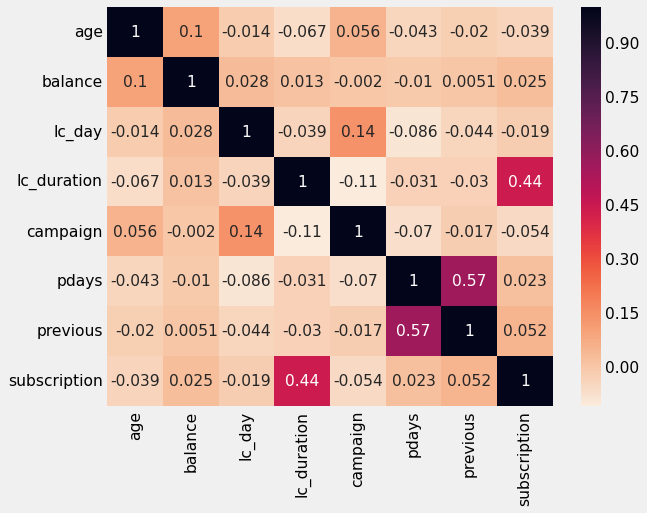

In [108]:
sns.heatmap(blue_collarjobs.corr(),cmap='rocket_r',annot=True)

In [78]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [80]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [296]:
def kdeplot(feat):
    sns.kdeplot(data=df,x=feat,palette='plasma',hue='subscription')

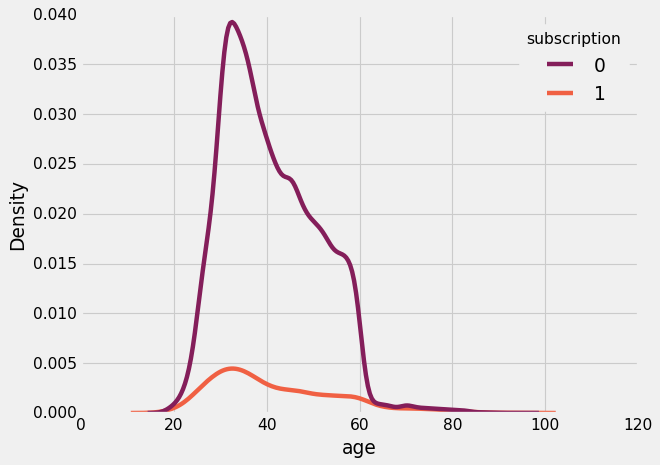

In [110]:
kdeplot('age')

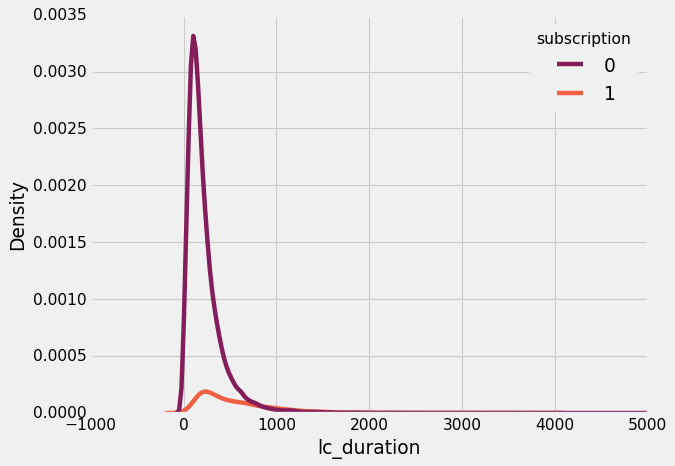

In [111]:
kdeplot('lc_duration')

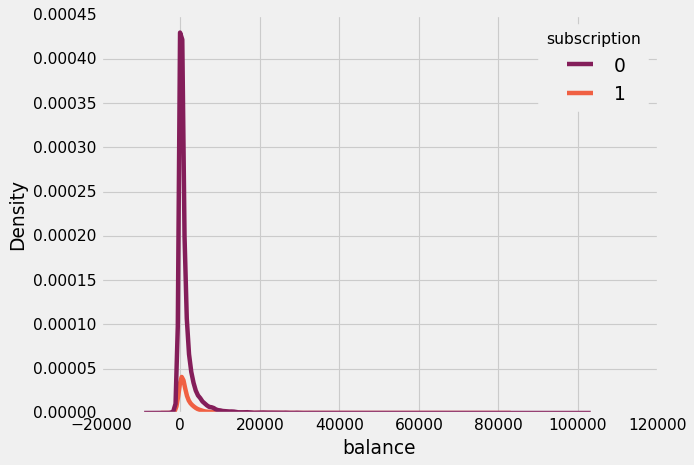

In [112]:
kdeplot('balance')

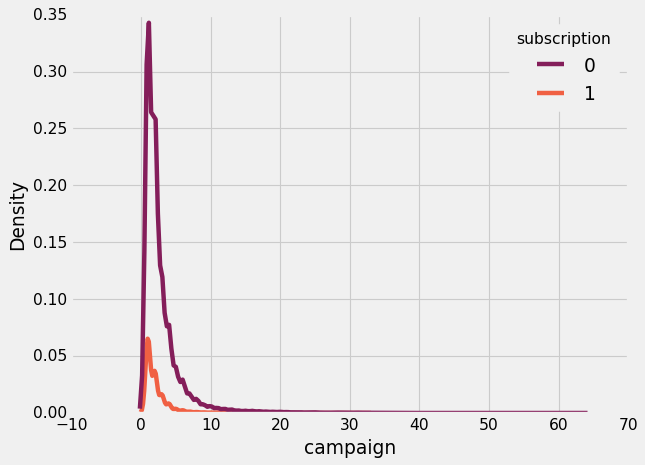

In [113]:
kdeplot('campaign')

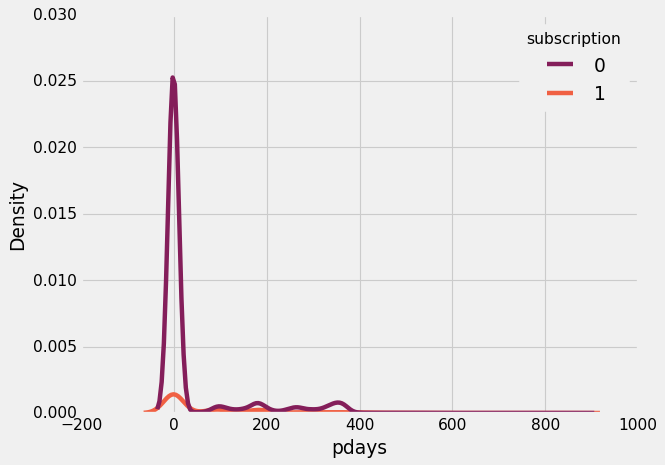

In [114]:
kdeplot('pdays')

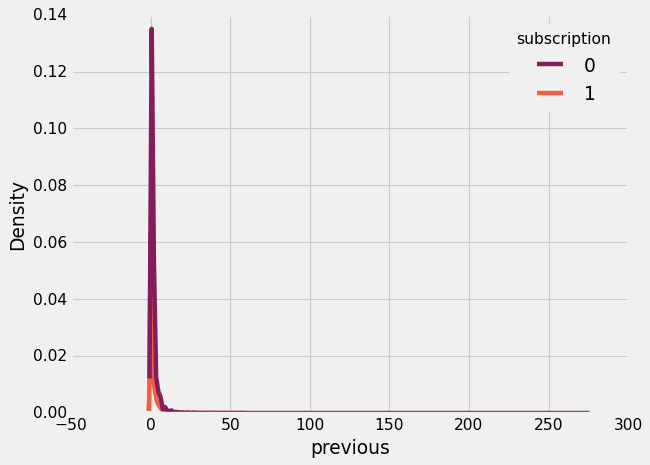

In [115]:
kdeplot('previous')

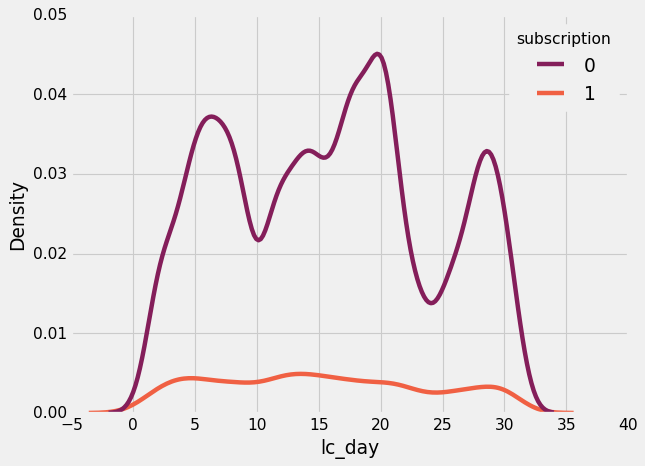

In [116]:
kdeplot('lc_day')

In [351]:
cat_features

['job',
 'marital_status',
 'education',
 'credit',
 'housing_loan',
 'personal_loan',
 'contact',
 'lc_month',
 'poutcome']

In [352]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

## goddammn  eda................

In [353]:
df_fun=df.copy()
df_fun

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,0


In [354]:
df_fun.campaign=df_fun.campaign.skew()

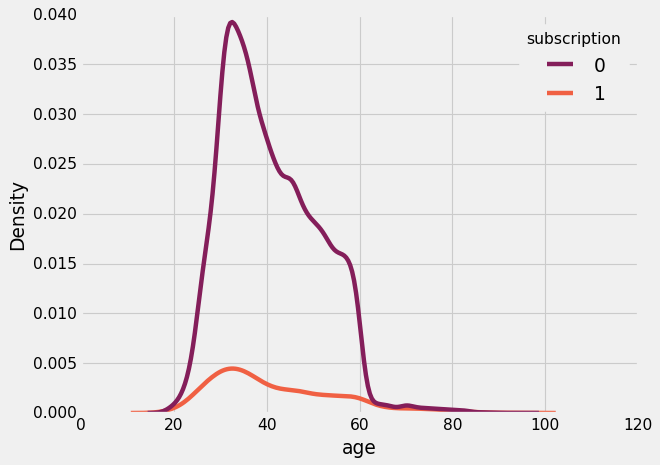

In [126]:
kdeplot('age')

In [229]:
df_fun.age=df_fun.age.transform(lambda x: np.log(x))

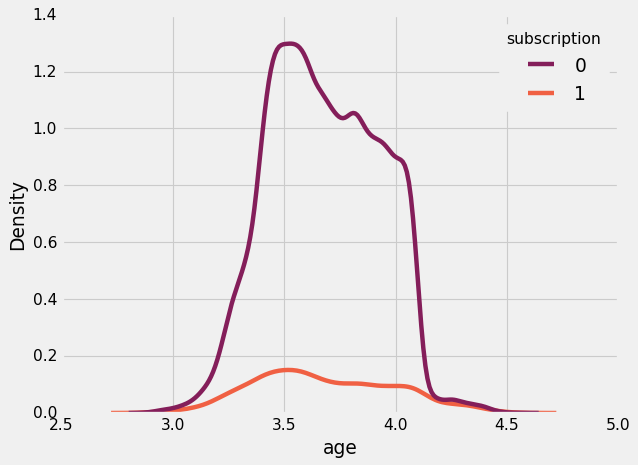

In [135]:
kdeplot('age')

In [137]:
df_fun.sample(frac=0.,replace=)

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
35125,3.433987,self-employed,single,secondary,no,148,yes,yes,cellular,6,may,232,2,167,4,failure,0
22384,3.970292,blue-collar,married,tertiary,no,0,no,no,cellular,22,aug,107,2,-1,0,unknown,0
9859,3.931826,technician,married,tertiary,no,1057,no,no,unknown,9,jun,149,2,-1,0,unknown,0
36304,3.784190,services,married,secondary,no,0,yes,yes,cellular,11,may,161,1,-1,0,unknown,0
5884,3.465736,blue-collar,divorced,secondary,no,3,yes,no,unknown,26,may,114,3,-1,0,unknown,0


In [160]:
df_fun.subscription

0        0
1        0
2        0
3        0
4        0
        ..
45206    1
45207    1
45208    1
45209    0
45210    0
Name: subscription, Length: 45211, dtype: int64

In [167]:
df_fun[cat_features]

,job,marital_status,education,credit,housing_loan,personal_loan,contact,lc_month,poutcome
0,management,married,tertiary,no,yes,no,unknown,may,unknown
1,technician,single,secondary,no,yes,no,unknown,may,unknown
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown
4,unknown,single,unknown,no,no,no,unknown,may,unknown
...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown
45208,retired,married,secondary,no,no,no,cellular,nov,success
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown


In [170]:
type(df_fun[['age']])

pandas.core.frame.DataFrame

In [172]:
type(df_fun['age'])

pandas.core.series.Series

In [173]:
df_fun.age.dtype

dtype('float64')

In [176]:
df_fun[['age','credit']]

,age,credit
0,4.060443,no
1,3.784190,no
2,3.496508,no
3,3.850148,no
4,3.496508,no
...,...,...
45206,3.931826,no
45207,4.262680,no
45208,4.276666,no
45209,4.043051,no


In [179]:
cat_features

['job',
 'marital_status',
 'education',
 'credit',
 'housing_loan',
 'personal_loan',
 'contact',
 'lc_month',
 'poutcome']

In [178]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

## data cleanisng and processing maybe.

In [274]:
from sklearn.compose import ColumnTransformer,make_column_transformer
from sklearn.preprocessing import power_transform,StandardScaler,OneHotEncoder,FunctionTransformer,MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn_pandas import dataframe_mapper
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_auc_score,accuracy_score,classification_report

In [242]:
num_features

['age',
 'balance',
 'lc_day',
 'lc_duration',
 'campaign',
 'pdays',
 'previous',
 'subscription']

In [356]:
for i in num_features[:-1]:
    df[i]=power_transform(df[i].values.reshape(-1,1))


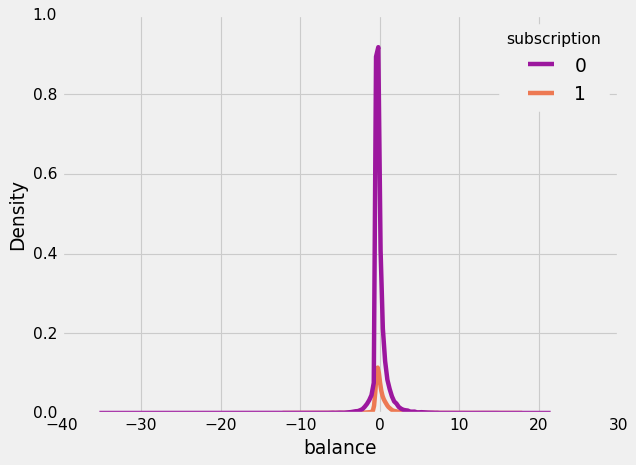

In [357]:
kdeplot('balance')

In [358]:
df

,age,job,marital_status,education,credit,balance,housing_loan,personal_loan,contact,lc_day,lc_month,lc_duration,campaign,pdays,previous,poutcome,subscription
0,1.473637,management,married,tertiary,no,0.414773,yes,no,unknown,-1.351873,may,0.386077,-1.108191,-0.472533,-0.472500,unknown,0
1,0.429379,technician,single,secondary,no,-0.410774,yes,no,unknown,-1.351873,may,-0.223033,-1.108191,-0.472533,-0.472500,unknown,0
2,-0.709873,entrepreneur,married,secondary,no,-0.431122,yes,yes,unknown,-1.351873,may,-0.923854,-1.108191,-0.472533,-0.472500,unknown,0
3,0.683128,blue-collar,married,unknown,no,0.197685,yes,no,unknown,-1.351873,may,-0.735678,-1.108191,-0.472533,-0.472500,unknown,0
4,-0.709873,unknown,single,unknown,no,-0.432119,no,no,unknown,-1.351873,may,0.072812,-1.108191,-0.472533,-0.472500,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.993503,technician,married,tertiary,no,-0.052398,no,no,cellular,0.220403,nov,2.057767,0.737650,-0.472533,-0.472500,unknown,1
45207,2.207438,retired,divorced,primary,no,0.275122,no,no,cellular,0.220403,nov,1.056254,0.134537,-0.472533,-0.472500,unknown,1
45208,2.257237,retired,married,secondary,no,1.495765,no,no,cellular,0.220403,nov,2.257271,1.323745,2.122381,2.166630,success,1
45209,1.409327,blue-collar,married,secondary,no,-0.114235,no,no,telephone,0.220403,nov,1.191963,1.091724,-0.472533,-0.472500,unknown,0


In [359]:
cat_features

['job',
 'marital_status',
 'education',
 'credit',
 'housing_loan',
 'personal_loan',
 'contact',
 'lc_month',
 'poutcome']

In [360]:
for i in cat_features:
    a=pd.get_dummies(df[i],drop_first=True)
    df=pd.concat([a,df],axis=1)
    df.drop(columns=i,inplace=True)

In [361]:
df

,other,success,unknown,aug,dec,feb,jan,jul,jun,mar,may,nov,oct,sep,telephone,unknown,yes,yes,yes,secondary,tertiary,unknown,married,single,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown,age,balance,lc_day,lc_duration,campaign,pdays,previous,subscription
0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1.473637,0.414773,-1.351873,0.386077,-1.108191,-0.472533,-0.472500,0
1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0.429379,-0.410774,-1.351873,-0.223033,-1.108191,-0.472533,-0.472500,0
2,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,-0.709873,-0.431122,-1.351873,-0.923854,-1.108191,-0.472533,-0.472500,0
3,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0.683128,0.197685,-1.351873,-0.735678,-1.108191,-0.472533,-0.472500,0
4,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,-0.709873,-0.432119,-1.351873,0.072812,-1.108191,-0.472533,-0.472500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.993503,-0.052398,0.220403,2.057767,0.737650,-0.472533,-0.472500,1
45207,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2.207438,0.275122,0.220403,1.056254,0.134537,-0.472533,-0.472500,1
45208,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,2.257237,1.495765,0.220403,2.257271,1.323745,2.122381,2.166630,1
45209,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1.409327,-0.114235,0.220403,1.191963,1.091724,-0.472533,-0.472500,0


In [362]:
df_good=df.copy()

In [363]:
df.subscription.value_counts()

0    39922
1     5289
Name: subscription, dtype: int64

In [365]:
from imblearn.combine import SMOTETomek
sampler=SMOTE(random_state=90)

In [385]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(df.iloc[:,:-1],df.iloc[:,-1:],random_state=56,test_size=0.3,stratify=df.iloc[:,-1:])
print(x_test.shape)
print(x_train.shape)
print(y_test.shape)
print(y_train.shape)

(13564, 42)
(31647, 42)
(13564, 1)
(31647, 1)


In [387]:
y_train.value_counts()

subscription
0               27945
1                3702
dtype: int64

In [406]:
 x_train_res, y_train_res=sampler.fit_resample(x_train.to_numpy(),y_train.to_numpy())

In [403]:
x_test_res,y_test_res=sampler.fit_resample(x_test.to_numpy(),y_test.to_numpy())

In [401]:
x_train_res.shape

(55890, 42)

In [408]:
sum(y_train_res)

27945

In [409]:
y_test_res.shape

(23954,)

In [410]:
sum(y_test_res)

11977

In [432]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier()

In [434]:
model.fit(x_res,y_res)

RandomForestClassifier()

In [435]:
model.score(x_train_res,y_train_res)

0.9999821077115764

In [436]:
y_pred=model.predict(x_test_res)

In [437]:
model.score(x_test_res,y_test_res)

0.9112465558988061

In [438]:
model.score(x_test_res,y_test_res)

0.9112465558988061

In [439]:
print(classification_report(y_test_res,y_pred))

'              precision    recall  f1-score   support\n\n           0       0.89      0.94      0.91     11977\n           1       0.94      0.88      0.91     11977\n\n    accuracy                           0.91     23954\n   macro avg       0.91      0.91      0.91     23954\nweighted avg       0.91      0.91      0.91     23954\n'

In [440]:
accuracy_score(y_test_res,y_pred)

0.9112465558988061

In [3]:
# the above accuracy can be further increased